In [1]:
import matplotlib.pyplot as plt
from matplotlib import rc

# 윈도우라면 맑은 고딕(Malgun Gothic) 권장
plt.rcParams['font.family'] = 'Malgun Gothic'  

# 혹은 Mac이라면 'AppleGothic', Ubuntu라면 'NanumGothic'
# plt.rcParams['font.family'] = 'AppleGothic'
# plt.rcParams['font.family'] = 'NanumGothic'

# 음수 기호 깨짐 방지
plt.rcParams['axes.unicode_minus'] = False

In [2]:
import torch
import torch.nn as nn
import numpy as np
import random
import torch.nn.functional as F
from torch.optim import Adam
from torchvision.models import efficientnet_v2_s, EfficientNet_V2_S_Weights
from torchvision.datasets import ImageFolder
from torch.utils.data.dataloader import DataLoader
from torchvision import transforms
import torchvision.transforms as T
import tqdm
import matplotlib.pyplot as plt
import torchvision

# 환경 및 경로설정
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DATA_DIR = "kfood_processed" # 실제 데이터셋 경로로 변경
BATCH_SIZE = 32
MODEL_PATH = "models/efficientnet_test_0826_1.pth"
# 모델 아키텍처 정의
num_classes = 149  # 실제 클래스 개수로 변경
weights = EfficientNet_V2_S_Weights.IMAGENET1K_V1
model = efficientnet_v2_s(weights=weights)

# 마지막 분류 레이어 수정 (학습 때와 동일하게)
in_features = model.classifier[1].in_features
model.classifier = nn.Sequential(
    # 첫 번째 선형레이어: in_features -> 중간크기1
    nn.Linear(in_features, in_features // 2),
    nn.ReLU(),
    nn.Dropout(p=0.2), # 과적합 방지를 위한 드롭 아웃 추가
    # 두 번째 선형레이어: 중간크기1 -> 중간크기2
    nn.Linear(in_features // 2, in_features // 4),
    nn.ReLU(),
    nn.Dropout(p=0.2),  # 추가적인 드롭 아웃
    # 세 번째 선형레이어: 중간크기2 -> 최종클래스 개수
    nn.Linear(in_features // 4, num_classes)
)

# 파일 로드 및 가중치 적용
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model.to(DEVICE)

# 데이터 전처리
base_transform = weights.transforms()   # Resize/CenterCrop/ToTensor/Normalize(이미지넷 정규화)

# 학습 데이터에 사용할 변환 (데이터 증강 추가)
transforms_train = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.7, 1.0)),    # 랜덤 크롭
    transforms.RandomHorizontalFlip(),  # 좌우 반전
    transforms.RandomRotation(15),  # 회전
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1), # 밝기/색감 왜곡
    transforms.RandomPerspective(distortion_scale=0.4, p=0.5),  # 찌그러짐
    transforms.RandomApply([transforms.GaussianBlur(3)], p=0.3), # 흐림 효과
    transforms.RandomGrayscale(p=0.1), # 흑백 변환 (가끔)
    base_transform
])

# 테스트 데이터에 사용할 변환
transforms_test = base_transform
# test 데이터셋 로드
test_datasets = ImageFolder(root=f"{DATA_DIR}/test", transform=transforms_test)
val_datasets = ImageFolder(root=f"{DATA_DIR}/val", transform=transforms_test)
train_datasets = ImageFolder(root=f"{DATA_DIR}/train", transform=transforms_train)

train_dataLoader = DataLoader(train_datasets, batch_size=BATCH_SIZE, shuffle=True)
val_dataLoader = DataLoader(val_datasets, batch_size=BATCH_SIZE, shuffle=False)
test_dataLoader = DataLoader(test_datasets, batch_size=BATCH_SIZE, shuffle=False)

In [3]:
from sklearn.metrics import confusion_matrix, classification_report

# y_true, y_pred = [], []
# model.eval()
# with torch.no_grad():
#     for images, labels in test_dataLoader:
#         images, labels = images.to(DEVICE), labels.to(DEVICE)
#         outputs = model(images)
#         _, preds = torch.max(outputs, 1)
#         y_true.extend(labels.cpu().numpy())
#         y_pred.extend(preds.cpu().numpy())

# print(classification_report(y_true, y_pred, target_names=train_datasets.classes))
y_true, y_pred = [], []
model.eval()
with torch.no_grad():
    for images, labels in test_dataLoader:
        images, labels = images.to(DEVICE), labels.to(DEVICE)
        outputs = model(images)
        preds = outputs.argmax(dim=1)
        y_true.extend(labels.detach().cpu().numpy())
        y_pred.extend(preds.detach().cpu().numpy())

# classification_report 출력
print("Classification Report:")
print(classification_report(
    y_true,
    y_pred,
    target_names=train_datasets.classes,  # 클래스 이름 매핑
    digits=4                              # 소수점 자
))

c:\Users\user\workspaces\POTENUP\project_august\practice\.venv\Lib\site-packages\PIL\Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Classification Report:
              precision    recall  f1-score   support

        가지볶음     0.9684    0.9200    0.9436       100
        간장게장     0.9223    0.9500    0.9360       100
        갈비구이     0.9277    0.7700    0.8415       100
         갈비찜     0.8851    0.7700    0.8235       100
         갈비탕     0.8737    0.8300    0.8513       100
        갈치구이     0.9151    0.9700    0.9417       100
        갈치조림     0.7949    0.9300    0.8571       100
         감자전     0.7823    0.9700    0.8661       100
        감자조림     0.9688    0.9300    0.9490       100
       감자채볶음     0.9510    0.9700    0.9604       100
         감자탕     0.8818    0.9700    0.9238       100
         갓김치     0.8738    0.9000    0.8867       100
       건새우볶음     0.9697    0.9600    0.9648       100
          경단     0.9388    0.9200    0.9293       100
         계란국     0.9307    0.9400    0.9353       100
        계란말이     0.9327    0.9700    0.9510       100
         계란찜     0.9800    0.9800    0.9800       100
    

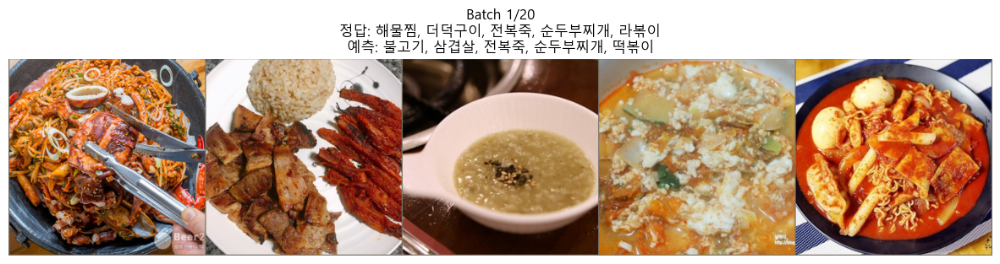

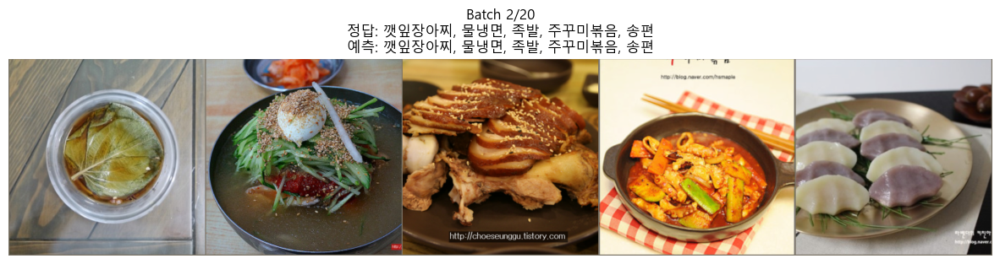

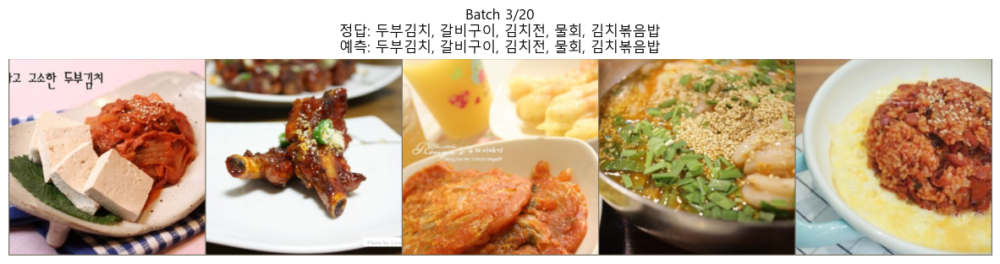

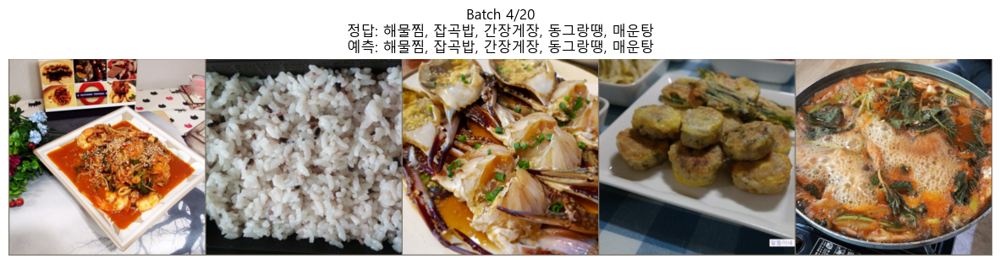

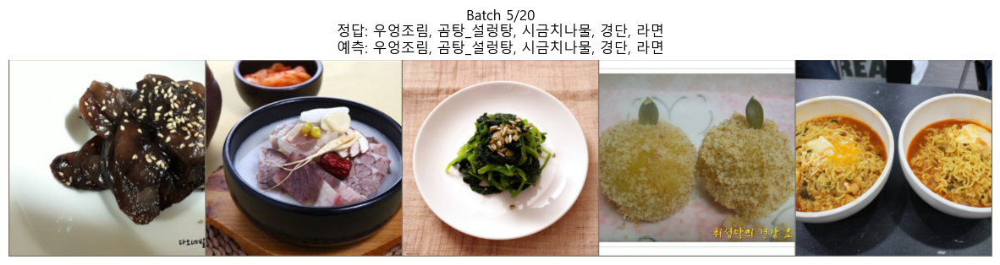

...

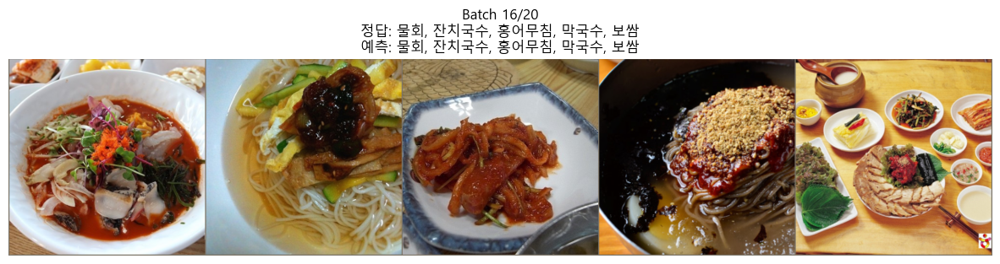

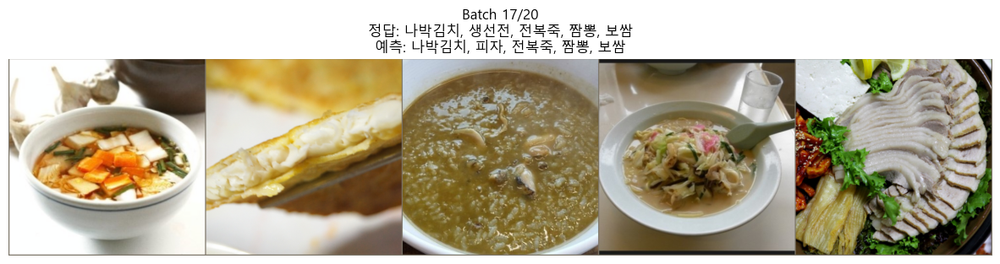

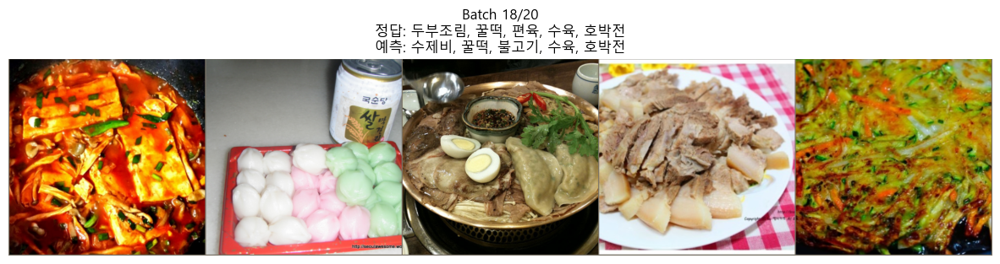

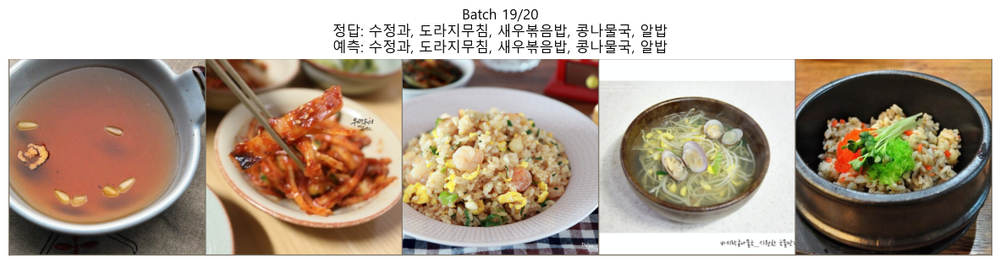

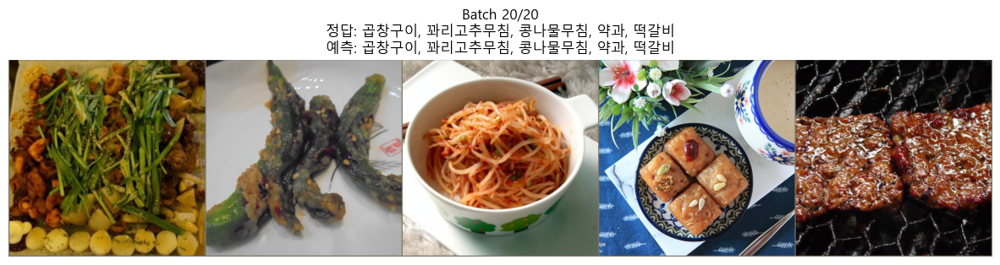

In [4]:
import matplotlib.pyplot as plt
import torchvision
import numpy as np
import random

# 설정
NUM_IMAGES_PER_SHOW = 5   # 한 번에 5장
NUM_SHOWS = 20            # 총 20번 (=100장)
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

model.eval()

# test_datasets 전체 인덱스에서 랜덤 샘플 추출
indices = list(range(len(test_datasets)))
random.shuffle(indices)

with torch.no_grad():
    for show_idx in range(NUM_SHOWS):
        # ✅ 랜덤 5개 뽑기
        sample_indices = indices[show_idx*NUM_IMAGES_PER_SHOW:(show_idx+1)*NUM_IMAGES_PER_SHOW]
        images, labels = zip(*[test_datasets[i] for i in sample_indices])

        # 배치 텐서 만들기
        images = torch.stack(images).to(DEVICE)
        labels = torch.tensor(labels).to(DEVICE)

        # 모델 예측
        outputs = model(images)
        preds = torch.max(outputs, 1)[1]

        # ==========================
        # 시각화 (5개 가로로 배치)
        # ==========================
        images_grid = torchvision.utils.make_grid(images, nrow=5, padding=2)
        np_img = images_grid.cpu().numpy().transpose((1, 2, 0))
        np_img = std * np_img + mean  # 정규화 복원
        np_img = np.clip(np_img, 0, 1)

        # 라벨/예측 변환
        true_labels = [train_datasets.classes[l] for l in labels.cpu().numpy()]
        pred_labels = [train_datasets.classes[p] for p in preds.cpu().numpy()]

        plt.figure(figsize=(15, 5))
        plt.imshow(np_img)
        plt.axis("off")
        plt.title(
            f"Batch {show_idx+1}/{NUM_SHOWS}\n"
            "정답: " + ", ".join(true_labels) + "\n"
            "예측: " + ", ".join(pred_labels)
        )
        plt.show()

In [ ]:
from torchmetrics.classification import MulticlassF1Score

# 분류할 클래스 개수에 맞춰 MulticlassF1Score 객체 정의
num_classes = 149
f1_metric = MulticlassF1Score(num_classes=num_classes, average='macro').to(DEVICE)

model.eval()
total_pred = 0

with torch.no_grad():
    for images, labels in test_dataLoader:
        preds = model(images.to(DEVICE))
        
        # MulticlassF1Score는 로짓(logit)이 아닌 예측된 클래스 인덱스를 입력으로 받는다
        _, preds = torch.argmax(preds.data, dim=1)
        
        f1_metric.update(preds, labels.to(DEVICE))

f1_score = f1_metric.compute()
print("F1 Score:", f1_score.item())

c:\Users\user\workspaces\POTENUP\project_august\practice\.venv\Lib\site-packages\PIL\Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


F1 Score: 0.9109636545181274


In [ ]:
# Validation F1
from torchmetrics.classification import MulticlassF1Score

# 분류할 클래스 개수에 맞춰 MulticlassF1Score 객체 정의
num_classes = 149
f1_metric = MulticlassF1Score(num_classes=num_classes, average='macro').to(DEVICE)

model.eval()
total_pred = 0

with torch.no_grad():
    for images, labels in val_dataLoader:
        preds = model(images.to(DEVICE))
        
        # MulticlassF1Score는 로짓(logit)이 아닌 예측된 클래스 인덱스를 입력으로 받는다
        _, preds = torch.argmax(preds.data, dim=1)
        
        f1_metric.update(preds, labels.to(DEVICE))

f1_score = f1_metric.compute()
print("F1 Score:", f1_score.item())

F1 Score: 0.913055956363678
